In [1]:
import pandas as pd
from shapely import wkt
import geopandas as gpd
import folium
from wazeasy import utils

In [2]:
df1 = pd.read_csv('../../data/waze/IQ_595baghdad_jams_1.csv', dtype = {'street': 'str', 'endNode': 'str',  'startNode': 'str'})
df2 = pd.read_csv('../../data/waze/IQ_595baghdad_jams_2.csv', dtype = {'street': 'str', 'endNode': 'str',  'startNode': 'str'})

In [3]:
df = pd.concat([df1, df2])

In [4]:
utils.convert_to_time(df, 'Asia/Baghdad')

# AM Peak

In [5]:
am = df[(df['hour']>=6)&(df['hour']<10)].copy()

In [8]:
segment_count_gdf = utils.get_jam_count_per_segment(am)

In [9]:
m = segment_count_gdf[['jam_count', 'geometry']].explore(column = 'jam_count', cmap = 'turbo', style_kwds={'weight': 3})
folium.TileLayer('CartoDB positron', name='Grayscale').add_to(m)
m

# AM disaggregated

In [27]:
import contextily as cx
import matplotlib.pyplot as plt

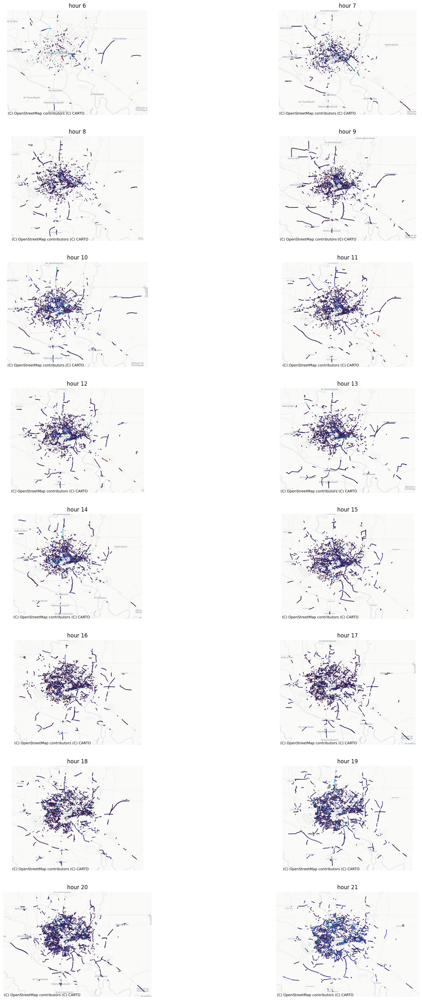

In [48]:
fig, axes = plt.subplots(nrows=8, ncols=2, figsize=(20, 40))
i = 0
j = 0
count = 0
for hour in range(6, 22):
    data_hour = df[(df['hour']==hour)].copy()
    segment_count_gdf = utils.get_jam_count_per_segment(data_hour)
    ax = segment_count_gdf[['jam_count', 'geometry']].plot(cmap = 'turbo', column = 'jam_count', ax = axes[i,j])
    cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, crs = 'epsg:4326')
    ax.set_axis_off()
    ax.set_title('hour {}'.format(hour))
    if j == 0:
        j = 1
    else:
        j = 0
    if (count%2 != 0):
        i+=1
    count += 1
    
plt.show()